# Encontrar documentos similares

El objetivo es contrar los documentos similares de Infoleg.

In [1]:
import sys
import os
import string
import re
import numpy as np
import pandas as pd

import nltk
from nltk.corpus import stopwords
from nltk.tokenize.toktok import ToktokTokenizer

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.metrics.pairwise import cosine_similarity 

### Stopwords

In [2]:
stop_words = stopwords.words('spanish')

In [3]:
print(" ".join(stop_words))

de la que el en y a los del se las por un para con no una su al lo como más pero sus le ya o este sí porque esta entre cuando muy sin sobre también me hasta hay donde quien desde todo nos durante todos uno les ni contra otros ese eso ante ellos e esto mí antes algunos qué unos yo otro otras otra él tanto esa estos mucho quienes nada muchos cual poco ella estar estas algunas algo nosotros mi mis tú te ti tu tus ellas nosotras vosotros vosotras os mío mía míos mías tuyo tuya tuyos tuyas suyo suya suyos suyas nuestro nuestra nuestros nuestras vuestro vuestra vuestros vuestras esos esas estoy estás está estamos estáis están esté estés estemos estéis estén estaré estarás estará estaremos estaréis estarán estaría estarías estaríamos estaríais estarían estaba estabas estábamos estabais estaban estuve estuviste estuvo estuvimos estuvisteis estuvieron estuviera estuvieras estuviéramos estuvierais estuvieran estuviese estuvieses estuviésemos estuvieseis estuviesen estando estado estada estados e

### Ubicación de los documentos

In [4]:
# Se verfica entorno de ejecución
in_colab = "google.colab" in sys.modules

if in_colab:
    from google.colab import drive

    drive.mount("/content/drive")
    BASE_DIR = "/content/drive/My Drive/Diplo2020 Mentoria/"
else:
    BASE_DIR = "./"
    
print("Directorio base:", BASE_DIR)

Directorio base: ./


In [5]:
FILES_DIR = BASE_DIR + 'Datos/Infoleg/'

print("Directorio con los documentos:", FILES_DIR)

Directorio con los documentos: ./Datos/Infoleg/


### Función de normalización

In [6]:
def normalize_texto(texto, stop_words):
    # Tokenización
    tokens = ToktokTokenizer().tokenize(texto)

    # Paso a minúscula
    tokens = [word.lower() for word in tokens]

    # eliminar la puntuación de cada palabra
    tokens = [re.sub('[%s]' % re.escape(string.punctuation), '', token) for token in tokens]
    
    # Eliminamos stopwords
    tokens = list(filter(lambda token: token not in stop_words, tokens)) 

    # eliminar los tokens de menos de 3 caracteres
    tokens = list(filter(lambda token: len(token) > 3, tokens))

    return ' '.join(tokens)

Probamos la función de normalización en un texto

In [7]:
texto = "Caracas —REPUBLICA BOLIVARIANA DE VENEZUELA— el 12 de julio de 2000, — REGISTRADO BAJO EL Nº 25.939 — EDUARDO O. CAMAÑO. — MARCELO A. GUINLE. — Eduardo D. Rollano. — Juan J. Canals."
print("Texto:\n", texto)
print("\n")
print("Texto normalizado:\n", normalize_texto(texto, stop_words))

Texto:
 Caracas —REPUBLICA BOLIVARIANA DE VENEZUELA— el 12 de julio de 2000, — REGISTRADO BAJO EL Nº 25.939 — EDUARDO O. CAMAÑO. — MARCELO A. GUINLE. — Eduardo D. Rollano. — Juan J. Canals.


Texto normalizado:
 caracas republica bolivariana venezuela julio 2000 registrado bajo 25939 eduardo camaño marcelo guinle eduardo rollano juan canals


### Leemos los documentos

Creamos un diccionario dondde los _keys_ el nombre del archivo y cada uno de los _values_ el texto normalizado del archivo.

In [8]:
token_dict = {}

for subdir, dirs, files in os.walk(FILES_DIR):
    for file in files:
        if file.startswith("."):
            continue
        archivo = subdir + os.path.sep + file
        with open(archivo, 'r', encoding='utf-8') as f:
            texto = f.read()
            token_dict[file] = normalize_texto(texto, stop_words)    
            
print("Se leyeron", len(token_dict), "documentos.")

Se leyeron 2500 documentos.


Observamos los 10 primeros elementos del diccionario

In [9]:
list(token_dict.keys())[0:10]

['100016.txt',
 '100025.txt',
 '100026.txt',
 '100027.txt',
 '100028.txt',
 '100029.txt',
 '100035.txt',
 '100037.txt',
 '100038.txt',
 '100041.txt']

### Vectorizamos utilizando tf-idf

TF-IDF son puntuaciones de frecuencia de palabras que tratan de resaltar las palabras que son más interesantes, por ejemplo, frecuentes en un documento pero no en todos los documentos.

In [10]:
vectorizer = TfidfVectorizer() 
vectorizer_vectors = vectorizer.fit_transform(token_dict.values())
print(f'Cantidad de palabras en nuestro vocabulario: {len(vectorizer.vocabulary_)}')

Cantidad de palabras en nuestro vocabulario: 58580


Generamos un DataFrame donde las filas son los documentos, las columnas cada uno de los términos de nuestro diccionario y las celdas es la puntuación de cada término en el documento.

In [11]:
testDF = pd.DataFrame(vectorizer_vectors.toarray(), index=token_dict.keys(), columns=vectorizer.get_feature_names())
testDF = testDF.sort_index(axis = 0)

Observamos el puntaje de las últimos 10 términos del diccionario, de lor primeros 10 documentos.

In [12]:
testDF.iloc[:10, -10:]

,último,últimos,única,únicamente,únicas,único,únicos,útil,útiles,útilmente
100016.txt,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
100025.txt,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
100026.txt,0.043417,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
100027.txt,0.036460,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
100028.txt,0.000000,0.019379,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
100029.txt,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
100035.txt,0.004836,0.003315,0.012117,0.022937,0.0,0.0,0.0,0.0,0.0,0.0
100037.txt,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
100038.txt,0.012042,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
100041.txt,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0


Aquí vemos 10 términos del diccionario que son similares

In [13]:
vectorizer.get_feature_names()[50000:50010]

['referidas',
 'referido',
 'referidos',
 'referir',
 'referirnos',
 'referirse',
 'referirá',
 'referirán',
 'referéndum',
 'refiera']

### Entrenamos un SVD y calculamos similitud del coseno

Introduction to Document Similarity: https://www.youtube.com/watch?v=MvG4dPplrRo&list=WL&index=10

The sklearn.decomposition module includes matrix decomposition algorithms, including among others PCA, NMF or ICA. Most of the algorithms of this module can be regarded as dimensionality reduction techniques.

decomposition.TruncatedSVD([n_components, …]): Dimensionality reduction using truncated SVD (aka LSA).
In particular, truncated SVD works on term count/tf-idf matrices as returned by the vectorizers in sklearn.feature_extraction.text. In that context, it is known as latent semantic analysis (LSA).

*Single Value Decomposition (SVD)*
* Método de descomposición de matrices para reducir una matriz poniendo en cero los valores menores a un umbral.

*Latent Semantic Analisis (LSA)*
* Método utilizado para extraer el uso contextual del significados de las palabras a través de estadística computacional aplicado a grandes corpus.
* Usa Single Value Decomposition (SVD) para condensar la matriz de términos de documentos.

*Cosine Similarirty*
* Calcula la similaridad midiendo el coseno del ángulo entre 2 vectores.
* Genermalmente utilizado en LSA para encontrar la similitud entre 2 documentos.

*Word Vectors*
* Trata de ingnorar la información acerca de cada documento individual para entender mejor la relación entre palabras.

Here we run our Tfidf matrix created above through Singular Value Decomposition and then calculate the Cosine Similarity of the documents to one another.

Singular Value Decomposition condenses our Tfidf matrix down a bit to make it easer to process. Here we also set the number of dimensions (n_components), how many times we iterate over the corpus, and then set de ramdom_state so that the results are reproducable.

Creamos y entrenamos el modelo

**Parámetros:**

*n_components: int, default=2*
>Desired dimensionality of output data. Must be strictly less than the number of features. For LSA, a value of 100 is recommended.

*n_iter: int, default=5*
>Number of iterations for randomized SVD solver. 

In [14]:
lsa = TruncatedSVD(n_components=100, n_iter=100, random_state=42)
dtm_lsa = lsa.fit_transform(vectorizer_vectors)

Calculamos la similitud de todos los documentos entre sí.

In [15]:
cosine_sim = cosine_similarity(dtm_lsa)

Mostramos el nivel de similitud entre los documentos. La escala de colores es verde lo mas similar, amarillo intermedio y rojo lo menos similar. Mostramos solamente los primeros 10 documentos.

In [16]:
df = pd.DataFrame(cosine_sim, index=token_dict.keys(), columns=token_dict.keys())
dfS = df[sorted(df)]
sorted_df = dfS.sort_index(axis=0)

In [17]:
color_df =  sorted_df.head().style.background_gradient(cmap='RdYlGn')
color_df

Observemos los documentos similiares a 100016.txt

In [18]:
# Puntuación de cada uno de los documentos.
cosine_sim[0:1]

array([[1.        , 0.03410797, 0.08879164, ..., 0.13888675, 0.26835514,
        0.29743506]])

In [19]:
# ordendo las puntuaciones y obtengo los indices de los 5 más similares. El primer índice es el mismo documento
cosine_sim_indices = cosine_sim[0:1].argsort()[0]
for i in cosine_sim_indices[:-7:-1]:
    file = list(token_dict.keys())[i:i+1][0]    
    print("Archivo", file)
    f = open(FILES_DIR + file, 'r', encoding='utf-8')
    print(f.read())

Archivo 100016.txt
ACUERDOS
Ley 25.939
Apruébase el Acuerdo Sobre Cooperación Minera suscripto en Caracas el 12 de julio de 2000 con la República Bolivariana de Venezuela. Elaboración de programas de Cooperación Científico-Técnica y de Acción. Solución de controversias.
Sancionada: Septiembre 22 de 2004
Promulgada de Hecho: Octubre 18 de 2004
El Senado y Cámara de Diputados de la Nación Argentina reunidos en Congreso, etc. sancionan con fuerza de Ley:
ARTICULO 1º — Apruébase el ACUERDO SOBRE COOPERACION MINERA ENTRE LA REPUBLICA ARGENTINA Y LA REPUBLICA BOLIVARIANA DE VENEZUELA, suscripto en Caracas —REPUBLICA BOLIVARIANA DE VENEZUELA— el 12 de julio de 2000, que consta de TRECE (13) artículos, cuya fotocopia autenticada forma parte de la presente ley.
ARTICULO 2º — Comuníquese al Poder Ejecutivo nacional.
DADA EN LA SALA DE SESIONES DEL CONGRESO ARGENTINO, EN BUENOS AIRES, A LOS VEINTIDOS DIAS DEL MES DE SEPTIEMBRE DEL AÑO DOS MIL CUATRO.
— REGISTRADO BAJO EL Nº 25.939 —
EDUARDO O. CA

### Buscamos los documentos similalres a un texto

In [20]:
texto = "ACUERDO SOBRE COOPERACION MINERA ENTRE LA REPUBLICA ARGENTINA Y LA REPUBLICA BOLIVARIANA DE VENEZUELA, suscripto en Caracas —REPUBLICA BOLIVARIANA DE VENEZUELA— el 12 de julio de 2000, — REGISTRADO BAJO EL Nº 25.939 — EDUARDO O. CAMAÑO. — MARCELO A. GUINLE. — Eduardo D. Rollano. — Juan J. Canals."

Normalizamos el texto

In [21]:
texto_normalizado = [normalize_texto(texto, stop_words)] 
texto_normalizado

['acuerdo cooperacion minera republica argentina republica bolivariana venezuela suscripto caracas republica bolivariana venezuela julio 2000 registrado bajo 25939 eduardo camaño marcelo guinle eduardo rollano juan canals']

Vectorizamos el texto normalizado

In [22]:
texto_vectorizer_vectors = vectorizer.transform(texto_normalizado)
texto_vectorizer_vectors

<1x58580 sparse matrix of type '<class 'numpy.float64'>'
	with 21 stored elements in Compressed Sparse Row format>

Aplicamos el modelo LSA al texto vectorizado

In [23]:
texto_dtm_lsa = lsa.transform(texto_vectorizer_vectors)

Calculamos la similitud del texto con todos los documentos anteriores.

In [24]:
texto_cosine_sim = cosine_similarity(texto_dtm_lsa, dtm_lsa)
texto_cosine_sim

array([[ 0.64828402, -0.01311226,  0.10040821, ...,  0.00928651,
         0.04671428,  0.0823124 ]])

Cargo un dataframe y muesto los documentos ordenados por mayor similitud

In [25]:
df_texto = pd.DataFrame(texto_cosine_sim, columns=token_dict.keys()).transpose().sort_values(by=[0],ascending=False)
df_texto[:5]

,0
129623.txt,0.674434
100016.txt,0.648284
128367.txt,0.634587
89826.txt,0.629901
100398.txt,0.621022


Observemos los documentos similiares al texto ingresado

In [26]:
cosine_sim_indices = texto_cosine_sim[0:1].argsort()[0]
for i in cosine_sim_indices[:-6:-1]:
    file = list(token_dict.keys())[i:i+1][0]    
    print("Archivo", file)
    f = open(FILES_DIR + file, 'r', encoding='utf-8')
    print(f.read())

Archivo 129623.txt
PERSONAL MILITAR
Ley 26.265
Autorízase la entrada de tropas extranjeras al territorio nacional y la salida fuera de él de fuerzas nacionales, según corresponda, para que participen del Ejercicio Combinado "Plata V".
Sancionada: junio 6 de 2007
Promulgada: junio 27 de 2007
El Senado y Cámara de Diputados
de la Nación Argentina reunidos en Congreso, etc.
sancionan con fuerza de
Ley:
ARTICULO 1º — Autorízase la entrada de tropas extranjeras al territorio nacional y la salida fuera de él de fuerzas nacionales, según corresponda, para que participen del Ejercicio Combinado ‘PLATA V’, de acuerdo a la información detallada en el ANEXO I, que forma parte integrante de la presente ley.
ARTICULO 2º — Comuníquese al Poder Ejecutivo nacional.
DADA EN LA SALA DE SESIONES DEL CONGRESO ARGENTINO, EN BUENOS AIRES, A LOS SEIS DIAS DEL MES DE JUNIO DEL AÑO DOS MIL SIETE.
— REGISTRADO BAJO EL Nº 26.265 —
ALBERTO BALESTRINI. — JOSE J. B. PAMPURO. — Enrique Hidalgo. — Juan H. Estrada.
AN

### Grabamos el mapa de calor en un archivo png

In [27]:
import seaborn as sns
import matplotlib.pyplot as plt

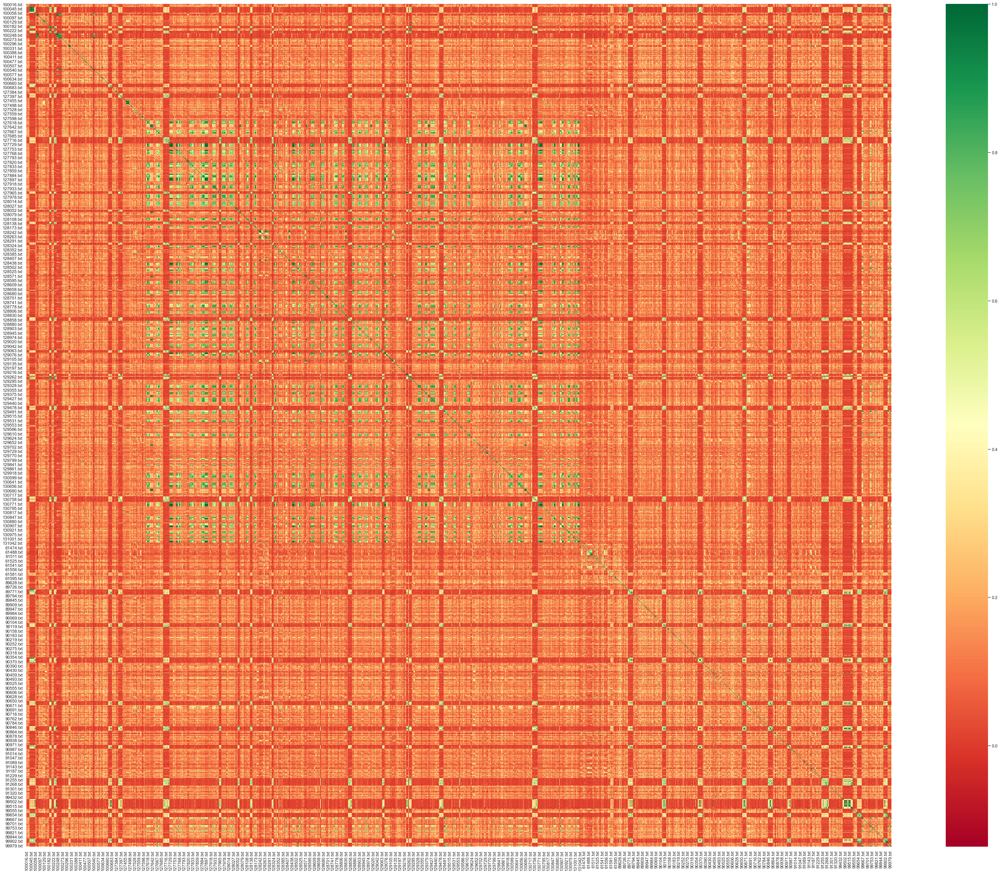

In [28]:
sns.set(rc={'figure.figsize':(50,40)}, font_scale=1)
ax = sns.heatmap(sorted_df, cmap='RdYlGn')
ax.figure.savefig(os.path.join(BASE_DIR, 'InfolegHeadMap.png'), dpi=300, bbox_inches='tight')
plt.show()

Observamos que exste una mayor similitud en el rando de documentos entre 127618.txt y 131042.txt

In [29]:
sorted_df.iloc[350:400, 350:400].style.background_gradient(cmap='RdYlGn')